<a href="https://colab.research.google.com/github/martinpius/Computer-Vission/blob/main/Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [51]:
from google.colab import drive
drive.mount("/content/drive", force_remount = True)
try: 
  COLAB = True
  import tensorflow as tf
  print(f"You are using colab with tensorflow version {tf.__version__}")
except:
  COLAB = False
  print(f"{type(e)}: {e}\n...please load your drive...")
def time_fmt(x:float = 123.7268)->float:
  h = int(x / (60 * 60))
  m = int(x % (60 * 60)/ 60)
  s = int(x % 60)
  return f"{h}: {m:>03}: {s:>05.2f}"
print(f"time elapse:----> {time_fmt()}")

Mounted at /content/drive
You are using colab with tensorflow version 2.4.1
time elapse:----> 0: 002: 03.00


In [52]:
import numpy as np
import time, os, requests
from PIL import Image, ImageFile
from matplotlib.pyplot import imshow
from io import BytesIO



[[[ 67  61 109]
  [ 68  62 110]
  [ 68  62 110]
  ...
  [ 48  43  97]
  [ 47  42  96]
  [ 47  42  96]]

 [[ 68  62 110]
  [ 68  62 110]
  [ 68  62 110]
  ...
  [ 48  43  97]
  [ 48  43  97]
  [ 48  43  97]]

 [[ 69  63 111]
  [ 68  62 110]
  [ 69  63 111]
  ...
  [ 50  45  99]
  [ 49  44  98]
  [ 50  45  99]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  3   1   4]
  ...
  [  5   5   3]
  [  4   4   2]
  [  6   5   3]]

 [[  0   0   0]
  [  0   0   0]
  [  3   1   4]
  ...
  [  6   6   4]
  [  4   4   2]
  [  5   4   2]]

 [[  1   1   1]
  [  1   1   1]
  [  4   2   5]
  ...
  [  6   6   4]
  [  5   5   3]
  [  5   4   2]]]


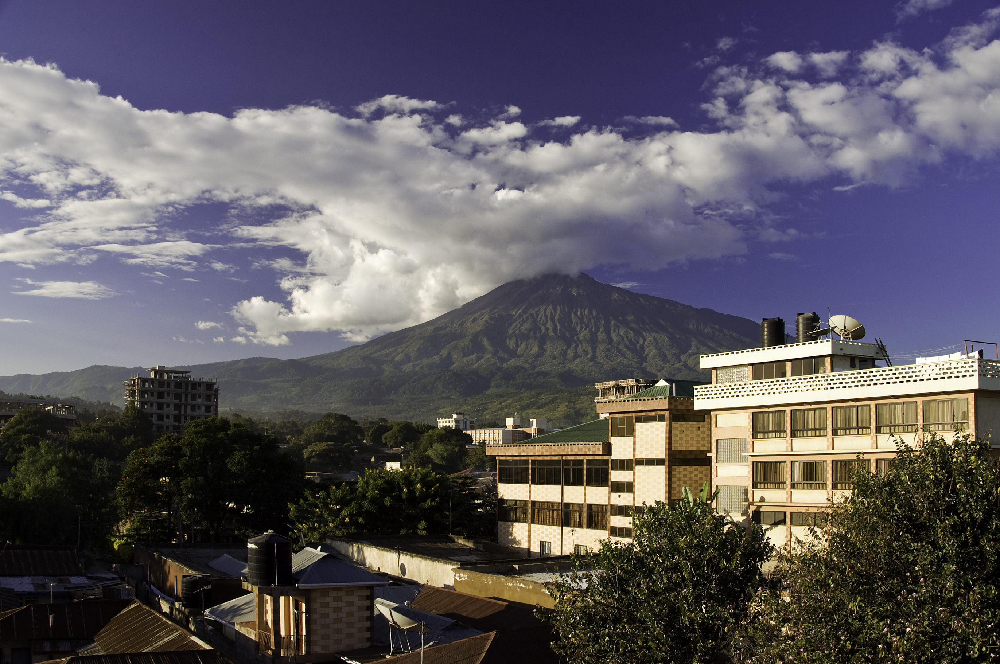

In [53]:
url = "https://upload.wikimedia.org/wikipedia/commons/3/3a/Look_at_Mt._Meru_Arusha_Tanzania.jpg"
response = requests.get(url)
img = Image.open(BytesIO(response.content))
img.load()
print(np.asarray(img))
img



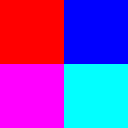

In [54]:
#Since image is a bunch of numbers (numpy arrays) we can also build our own images from the scratch:
h, w = 128, 128
img = np.zeros(shape = (h, w,3), dtype = np.uint8)
#We can now create some color parttern and concatenate as one image file
for row in range(64):
  for col in range(64):
    img[row, col] = [255,0,0]

for row in range(64):
  for col in range(64):
    img[row + 64, col] = [255,0, 255]

for row in range(64):
  for col in range(64):
    img[row, col + 64] = [0, 0, 255]

for row in range(64):
  for col in range(64):
    img[row + 64, col + 64] = [2, 255, 255]

my_image = Image.fromarray(img, 'RGB')
display(my_image)


In [55]:
#We can also modify the image to create a new image:
#consider the following image of Arusha clock tower in 1952

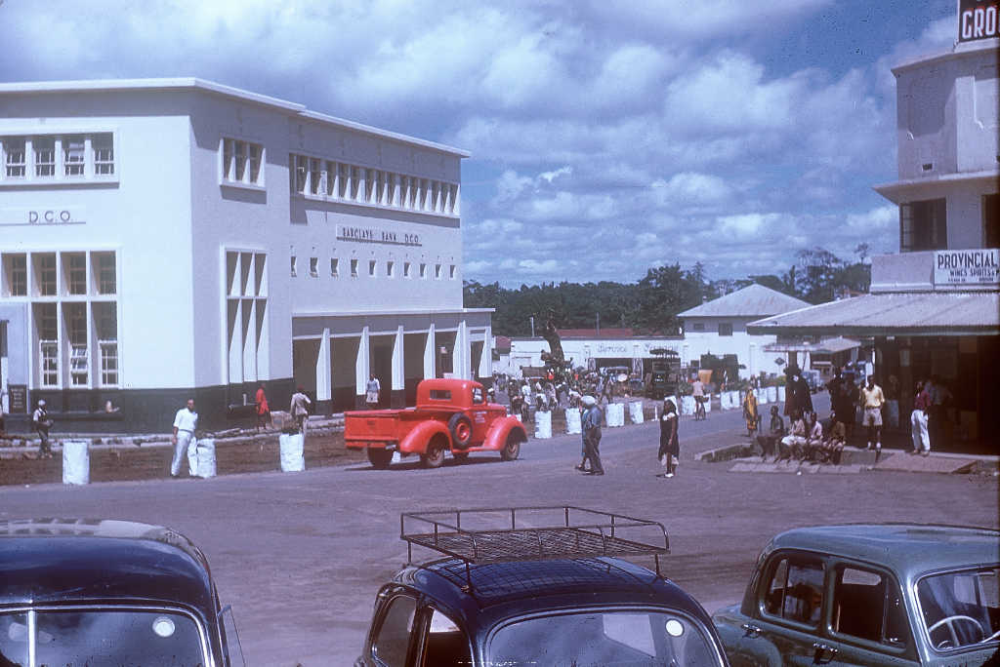

In [56]:
url = "https://upload.wikimedia.org/wikipedia/commons/d/d0/Clock_tower_May_1953.jpg"
response = requests.get(url)
arusha = Image.open(BytesIO(response.content))
arusha.load()
arusha_array = np.asarray(arusha)
display(arusha)
rows = arusha_array.shape[0]
cols = arusha_array.shape[1]


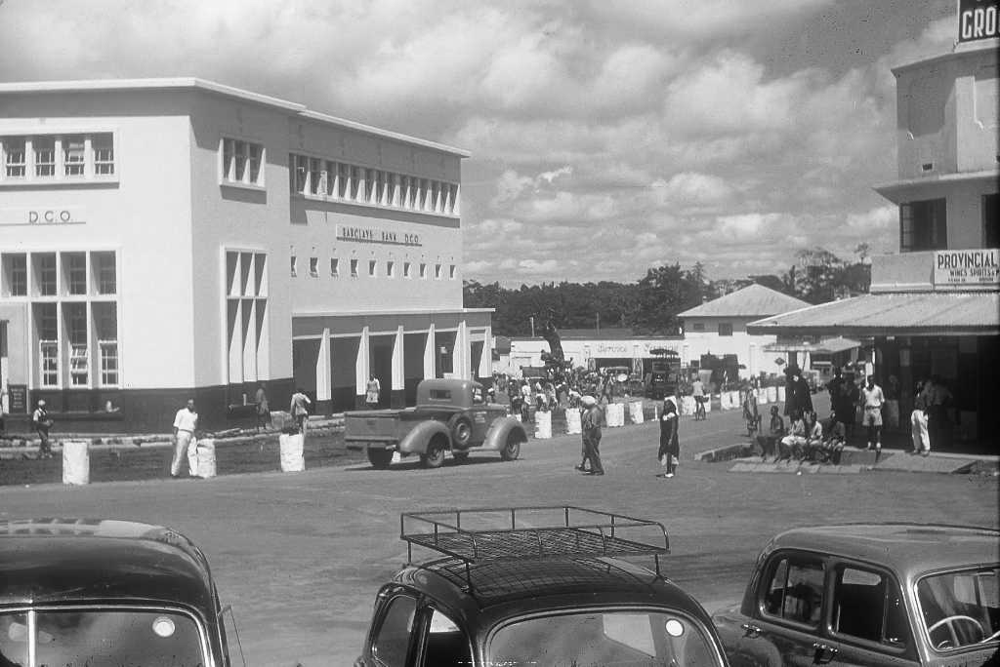

In [57]:
#We create a new image using the existing image file as follows:
new_arusha = np.zeros(shape = (rows, cols, 3), dtype = np.uint8)

for row in range(rows):
  for col in range(cols):
    r = np.mean(arusha_array[row, col])
    new_arusha[row,col] = [r,r,r]

arusha_new = Image.fromarray(new_arusha, 'RGB')
display(arusha_new)

In [58]:
#Read and processes multiple images at once:
#We read multiple image files from the ulr's, we process the files according to specifications (here lets say changing the shapes):
#We print out all files at once.

In [59]:
#We pull several images of arusha cit, Tanzania from the wikipedia. 
images = ["https://upload.wikimedia.org/wikipedia/commons/d/d0/Clock_tower_May_1953.jpg",
            "https://upload.wikimedia.org/wikipedia/commons/thumb/3/3a/Look_at_Mt._Meru_Arusha_Tanzania.jpg/2560px-Look_at_Mt._Meru_Arusha_Tanzania.jpg",
            "https://upload.wikimedia.org/wikipedia/commons/9/97/Arusha_Clocktower.jpg",
            "https://upload.wikimedia.org/wikipedia/commons/thumb/f/f3/Regional_Air_Arusha.jpg/2880px-Regional_Air_Arusha.jpg",
            "https://upload.wikimedia.org/wikipedia/commons/thumb/e/eb/Arusha%2C_Tanzania_%28Explored%29_-_Flickr_-_romanboed.jpg/2560px-Arusha%2C_Tanzania_%28Explored%29_-_Flickr_-_romanboed.jpg",
            "https://upload.wikimedia.org/wikipedia/commons/thumb/b/b2/Kulturhuset_-_Utifr%C3%A5n.jpg/2560px-Kulturhuset_-_Utifr%C3%A5n.jpg",
            "https://timbuktutravel.imgix.net/2018/07/0-arusha-tanzania-timbuktu-travel-1.jpg?auto=compress%2Cformat&ixlib=php-1.1.0&q=50",
            "https://www.thetanzanianassociate.com/wp-content/uploads/2020/03/Arushapic-1.jpg",
            "http://www.bushbuckltd.com/blog/wp-content/uploads/2016/02/arusha.jpg",
            "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQJxdH4frpwg5RIs7AS3UxTCBGrNK0oOWmTEg&usqp=CAU",
          "https://i1.rgstatic.net/ii/profile.image/990887668621314-1613257438141_Q512/Pius-Marthin.jpg"]

https://upload.wikimedia.org/wikipedia/commons/d/d0/Clock_tower_May_1953.jpg


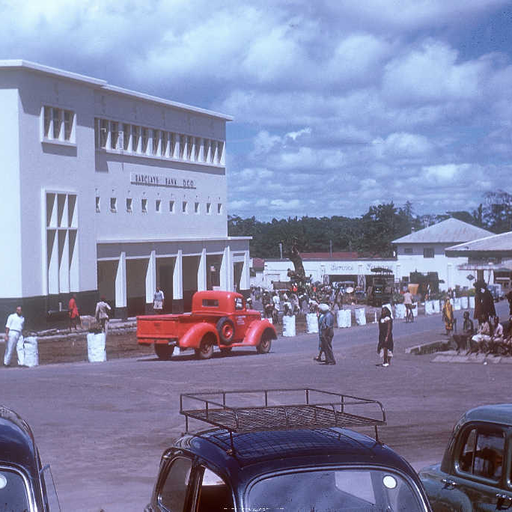

https://upload.wikimedia.org/wikipedia/commons/thumb/3/3a/Look_at_Mt._Meru_Arusha_Tanzania.jpg/2560px-Look_at_Mt._Meru_Arusha_Tanzania.jpg


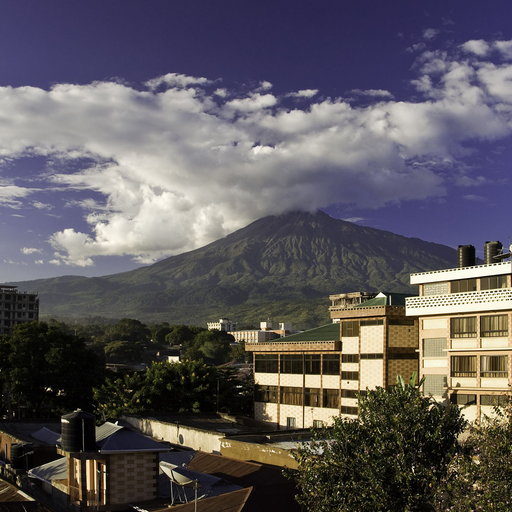

https://upload.wikimedia.org/wikipedia/commons/9/97/Arusha_Clocktower.jpg


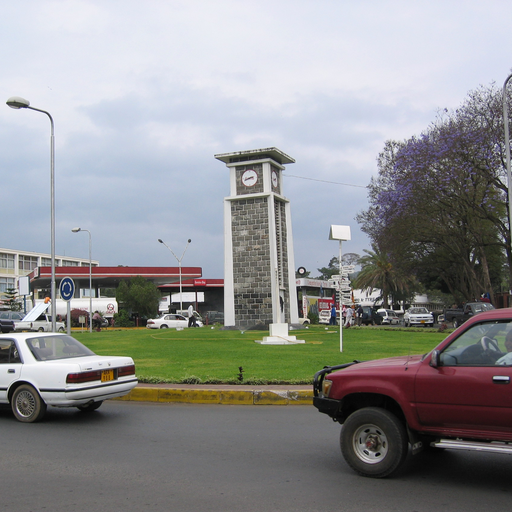

https://upload.wikimedia.org/wikipedia/commons/thumb/f/f3/Regional_Air_Arusha.jpg/2880px-Regional_Air_Arusha.jpg


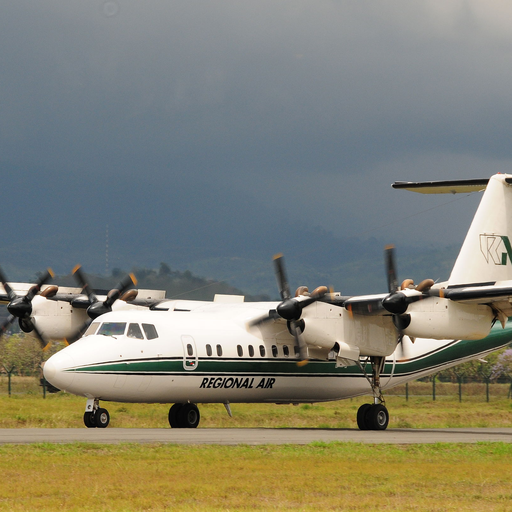

https://upload.wikimedia.org/wikipedia/commons/thumb/e/eb/Arusha%2C_Tanzania_%28Explored%29_-_Flickr_-_romanboed.jpg/2560px-Arusha%2C_Tanzania_%28Explored%29_-_Flickr_-_romanboed.jpg


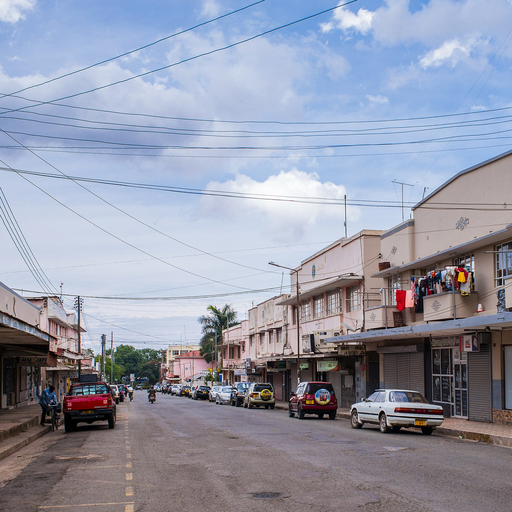

https://upload.wikimedia.org/wikipedia/commons/thumb/b/b2/Kulturhuset_-_Utifr%C3%A5n.jpg/2560px-Kulturhuset_-_Utifr%C3%A5n.jpg


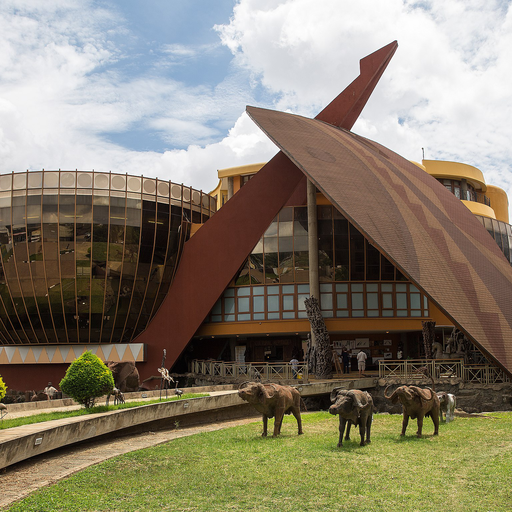

https://timbuktutravel.imgix.net/2018/07/0-arusha-tanzania-timbuktu-travel-1.jpg?auto=compress%2Cformat&ixlib=php-1.1.0&q=50


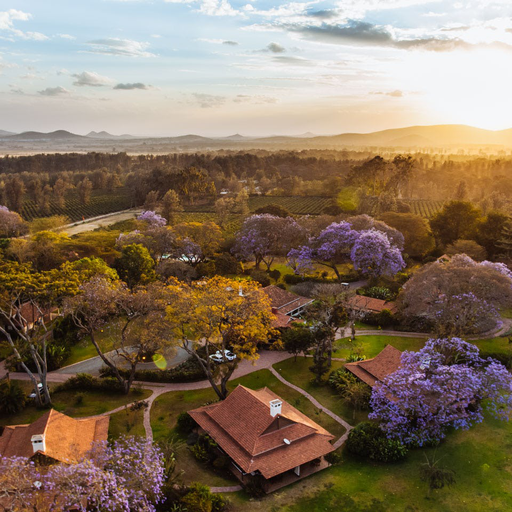

https://www.thetanzanianassociate.com/wp-content/uploads/2020/03/Arushapic-1.jpg


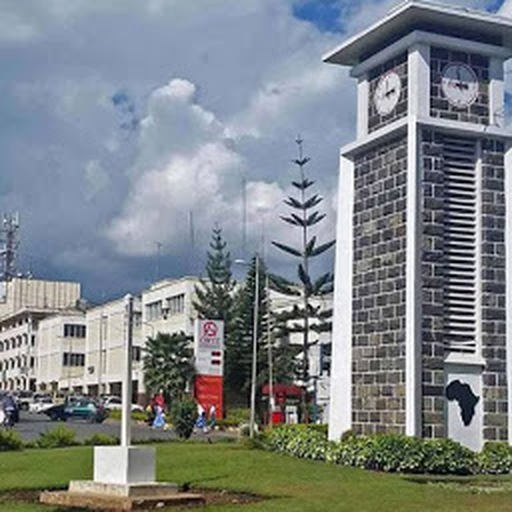

http://www.bushbuckltd.com/blog/wp-content/uploads/2016/02/arusha.jpg


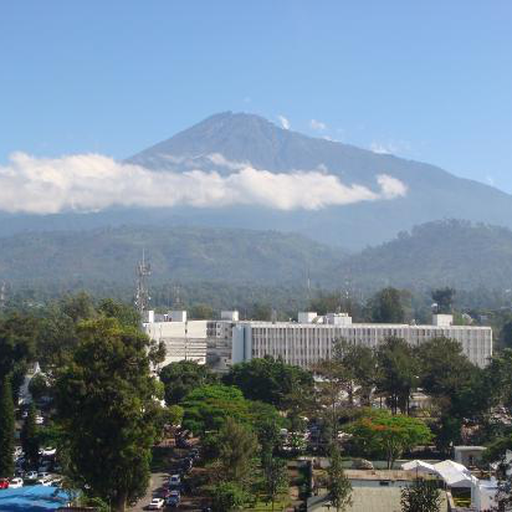

https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQJxdH4frpwg5RIs7AS3UxTCBGrNK0oOWmTEg&usqp=CAU


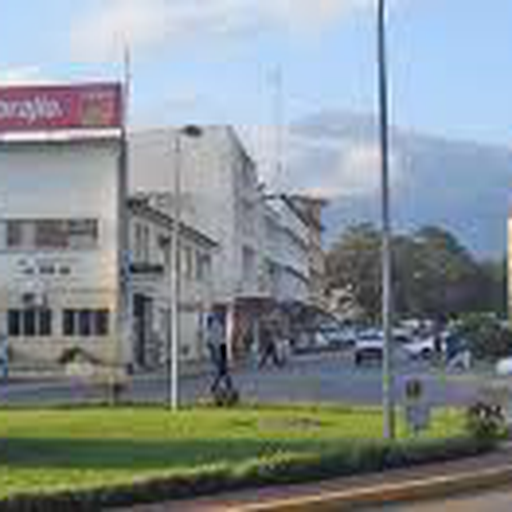

https://i1.rgstatic.net/ii/profile.image/990887668621314-1613257438141_Q512/Pius-Marthin.jpg


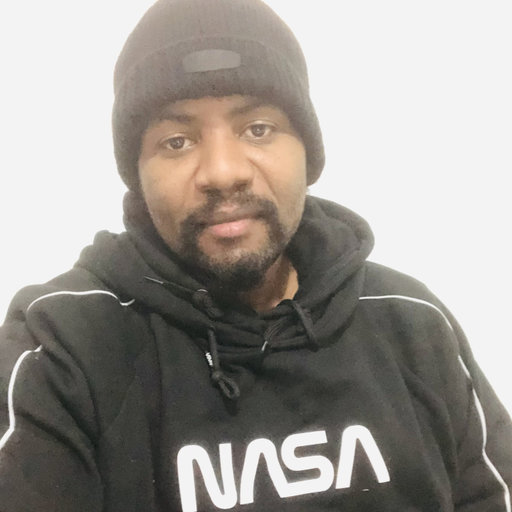

 This folder is of size: (11, 786432)
processing time is: 0: 000: 05.00


In [60]:
tic = time.time()
def squared_fmt(img):
    cols,rows = img.size
    extra = abs(rows-cols)/2
    
    if rows>cols:
        r = (0,extra,cols,cols+extra)
    else:
        r = (extra,0,rows+extra,rows)

    return img.crop(r)
    
img_folder = [] 
    
for url in images:
    ImageFile.LOAD_TRUNCATED_IMAGES = False
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img.load()
    img = squared_fmt(img)
    img = img.resize((512,512), Image.ANTIALIAS)
    print(url)
    display(img)
    img_array = np.asarray(img)
    img_array = img_array.flatten()
    img_array = img_array.astype(np.float32)
    img_array = (img_array-512)/512
    img_folder.append(img_array)
    

img_folder = np.array(img_folder)

print(f" This folder is of size: {img_folder.shape}")
toc = time.time()
print(f"processing time is: {time_fmt(toc - tic)}")